# Wrangle

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px



In [2]:
df = pd.read_csv('dataset.csv')

In [3]:
df

,incident_number,court_number,arrest_date,arresting_agency,crime_type,list_of_booked_charges,booked_case_type,dv_case,da_action_taken,data_as_of,data_loaded_at
0,110063548,11002204,2011/01/21,SFPD,Willful Homicide,187A,Felony,No,Discharged,2022/09/08,09/19/2022 10:00:52 PM
1,61277876,11008968,2011/03/31,SFPD,Willful Homicide,187A,Felony,No,Discharged,2022/09/08,09/19/2022 10:00:52 PM
2,110253040,11008679,2011/03/28,SFPD,Willful Homicide,"187A,187A",Felony,No,Discharged,2022/09/08,09/19/2022 10:00:52 PM
3,Z20110525-02460003,2460003,2011/05/25,SFPD,Willful Homicide,"187A,211,245A",Felony,No,Discharged,2022/09/08,09/19/2022 10:00:52 PM
4,110550595,11018969,2011/07/15,SFPD,Willful Homicide,187A,Felony,No,Discharged,2022/09/08,09/19/2022 10:00:52 PM
...,...,...,...,...,...,...,...,...,...,...,...
141587,220349292,22005215,2022/05/28,SFPD,NaN,NaN,Misd Arrest,No,Charges Filed,2022/09/08,09/19/2022 10:00:52 PM
141588,220346191,22005154,2022/05/27,SFPD,NaN,NaN,Misd Arrest,No,Charges Filed,2022/09/08,09/19/2022 10:00:52 PM
141589,220362147,22005395,2022/06/02,SFPD,NaN,NaN,Misd Arrest,No,Charges Filed,2022/09/08,09/19/2022 10:00:52 PM
141590,Z20220605-22005456,22005456,2022/06/05,SFSD,NaN,NaN,Misd Arrest,No,Charges Filed,2022/09/08,09/19/2022 10:00:52 PM


In [5]:
df.isnull().value_counts()

incident_number  court_number  arrest_date  arresting_agency  crime_type  list_of_booked_charges  booked_case_type  dv_case  da_action_taken  data_as_of  data_loaded_at
False            False         False        False             False       False                   False             False    False            False       False             138976
                                                              True        False                   False             False    False            False       False               2408
                                            True              False       False                   False             False    False            False       False                136
                                            False             True        True                    False             False    False            False       False                 62
                                            True              True        False                   False            

In [8]:
for col in df:
    print(col, '\n', df[col].isnull().value_counts())

incident_number 
 False    141592
Name: incident_number, dtype: int64
court_number 
 False    141592
Name: court_number, dtype: int64
arrest_date 
 False    141592
Name: arrest_date, dtype: int64
arresting_agency 
 False    141446
True        146
Name: arresting_agency, dtype: int64
crime_type 
 False    139112
True       2480
Name: crime_type, dtype: int64
list_of_booked_charges 
 False    141530
True         62
Name: list_of_booked_charges, dtype: int64
booked_case_type 
 False    141592
Name: booked_case_type, dtype: int64
dv_case 
 False    141592
Name: dv_case, dtype: int64
da_action_taken 
 False    141592
Name: da_action_taken, dtype: int64
data_as_of 
 False    141592
Name: data_as_of, dtype: int64
data_loaded_at 
 False    141592
Name: data_loaded_at, dtype: int64


In [12]:
df = df.dropna()

In [14]:
df = df.reset_index(drop=True)

In [15]:
df.describe()

,court_number
count,1.389760e+05
mean,1.541629e+07
std,3.820118e+06
min,1.200945e+06
25%,1.300681e+07
50%,1.502396e+07
75%,1.801766e+07
max,2.250004e+07


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138976 entries, 0 to 138975
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   incident_number         138976 non-null  object
 1   court_number            138976 non-null  int64 
 2   arrest_date             138976 non-null  object
 3   arresting_agency        138976 non-null  object
 4   crime_type              138976 non-null  object
 5   list_of_booked_charges  138976 non-null  object
 6   booked_case_type        138976 non-null  object
 7   dv_case                 138976 non-null  object
 8   da_action_taken         138976 non-null  object
 9   data_as_of              138976 non-null  object
 10  data_loaded_at          138976 non-null  object
dtypes: int64(1), object(10)
memory usage: 11.7+ MB


In [19]:
df = df.drop(columns=['incident_number', 'data_loaded_at', 'data_as_of'])

In [20]:
df

,court_number,arrest_date,arresting_agency,crime_type,list_of_booked_charges,booked_case_type,dv_case,da_action_taken
0,11002204,2011/01/21,SFPD,Willful Homicide,187A,Felony,No,Discharged
1,11008968,2011/03/31,SFPD,Willful Homicide,187A,Felony,No,Discharged
2,11008679,2011/03/28,SFPD,Willful Homicide,"187A,187A",Felony,No,Discharged
3,2460003,2011/05/25,SFPD,Willful Homicide,"187A,211,245A",Felony,No,Discharged
4,11018969,2011/07/15,SFPD,Willful Homicide,187A,Felony,No,Discharged
...,...,...,...,...,...,...,...,...
138971,22009862,2022/08/31,SFPD,NA (Att.),664/211,Felony,No,Charges Filed
138972,13019620,2013/07/15,SFPD,NA (Att.),664/459,Felony,No,Charges Filed
138973,14015903,2014/06/15,SFPD,NA (Att.),664/211,Felony,No,Charges Filed
138974,20006299,2020/05/30,SFPD,NA (Att.),664/459,Felony,No,Charges Filed


In [21]:
from wrangle import summarize, column_value_counts

In [22]:
column_value_counts(df)

Column Name:  court_number 
--------------
Numerical: Divided by Quartile
 -  10 bins


|                                 |   court_number |
|:--------------------------------|---------------:|
| (1179645.9000000001, 3330854.9] |           3337 |
| (3330854.9, 5460764.8]          |              0 |
| (5460764.8, 7590674.7]          |              0 |
| (7590674.7, 9720584.6]          |              0 |
| (9720584.6, 11850494.5]         |          14834 |
| (11850494.5, 13980404.4]        |          28516 |
| (13980404.4, 16110314.3]        |          36498 |
| (16110314.3, 18240224.2]        |          22649 |
| (18240224.2, 20370134.1]        |          20098 |
| (20370134.1, 22500044.0]        |          13044 |



-------------
Column Name:  arrest_date 
--------------
Categorical:
 -  4266 Categories

 2012/10/17    69
2012/03/21    69
2012/01/12    66
2013/09/12    66
2011/01/04    65
              ..
2022/05/09     9
2022/05/28     8
2021/10/10     8
2022/06/16     8
2021/07/06     6
Name: arrest_date, Length: 4266, dtype: int64


-------------
Column Name:  arresting_agency 
--------------
Categorical:
 -  24 Categories


|      |   arresting_agency |
|:-----|-------------------:|
| SFPD |             109265 |
| SFSD |              15511 |
| CHP  |               9318 |
| BART |               1359 |
| OTH  |                666 |
| APD  |                629 |
| UCPO |                627 |
| SFSU |                436 |
| USPA |                423 |
| OTHE |                407 |
| SFDA |                123 |
| UCSF |                106 |
| SFSO |                 67 |
| CHPS |                 10 |
| CHPI |                  9 |
| USPS |                  6 |
| ACC  |                  5 |
| FBI  |                  2 |
| FDEA |                  2 |
| MUNI |                  1 |
| CDOJ |                  1 |
| SAN  |                  1 |
| MVPD |                  1 |
| SFSC |                  1 |



-------------
Column Name:  crime_type 
--------------
Categorical:
 -  46 Categories


|                                   |   crime_type |
|:----------------------------------|-------------:|
| Assault                           |        26284 |
| Narcotics                         |        19475 |
| Other                             |        14313 |
| Burglary                          |        13566 |
| DUI                               |        12245 |
| Assault and Battery               |        11519 |
| Theft                             |         7668 |
| Robbery                           |         6962 |
| Weapons                           |         5701 |
| Motor Vehicle Theft               |         5491 |
| Petty Theft                       |         2090 |
| Trespassing                       |         1850 |
| Marijauana                        |         1524 |
| Selected Traffic                  |         1451 |
| Other Sex Law Violations          |         1048 |
| Prostitution                      |          800 |
| Willful Homicide (Att.)           |          738 |
| Forgery, Checks, Access Cards     |          647 |
| Forcible Rape                     |          628 |
| Arson                             |          603 |
| Kidnapping                        |          571 |
| NA (Att.)                         |          505 |
| Willful Homicide                  |          460 |
| Other Theft                       |          446 |
| Hit-and-Run                       |          444 |
| Vandalism                         |          443 |
| Local SF Ordinance                |          290 |
| Disorderly Conduct                |          208 |
| Indecent Exposure                 |          191 |
| Liquor Laws                       |          174 |
| Malicious Mischief                |          114 |
| Disturbing Peace                  |          105 |
| Lewd Conduct                      |          104 |
| Manslaughter - Vehicular          |           76 |
| Lewd or Lascivious                |           65 |
| Escape                            |           59 |
| Unlawful Sexual Intercourse       |           39 |
| Manslaughter - Non Vehicular      |           18 |
| Annoy/Molest Children             |           16 |
| Enhancements                      |           15 |
| Faiulre to Appear/Non-Traffic     |           11 |
| Contributing Delinquency of Minor |            9 |
| Gambling                          |            6 |
| Probation Violation               |            2 |
| Obscene Matter                    |            1 |
| Incorrect Categorization          |            1 |



-------------
Column Name:  list_of_booked_charges 
--------------
Categorical:
 -  48813 Categories

 23152A,23152B                                                       4459
243E1                                                               3912
273.5A                                                              3779
166A4                                                               3150
459                                                                 2213
                                                                    ... 
496A,459,459,182A1,182A1,496A,466,459,182A1                            1
182A1,2800.2A,20002A,636.5,22350,459,496A,496D,148A1,10851A,496A       1
459,496A,485,466                                                       1
496DA,10851A,459,496A,496A,182A1                                       1
664/192A                                                               1
Name: list_of_booked_charges, Length: 48813, dtype: int64


-------------
Column Name:  book

|             |   booked_case_type |
|:------------|-------------------:|
| Felony      |              96974 |
| Misd Arrest |              42002 |



-------------
Column Name:  dv_case 
--------------
Categorical:
 -  2 Categories


|     |   dv_case |
|:----|----------:|
| No  |    122034 |
| Yes |     16942 |



-------------
Column Name:  da_action_taken 
--------------
Categorical:
 -  5 Categories


|                                 |   da_action_taken |
|:--------------------------------|------------------:|
| Charges Filed                   |             62988 |
| Discharged                      |             43204 |
| MTR/Referred to Other Agency    |             19823 |
| Further Investigation Requested |              7566 |
| Other Action                    |              5395 |



-------------
-----------------
---End of Line---


In [25]:
type(df.list_of_booked_charges[10])

str

In [26]:
df = df.drop(columns='list_of_booked_charges')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138976 entries, 0 to 138975
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   court_number      138976 non-null  int64 
 1   arrest_date       138976 non-null  object
 2   arresting_agency  138976 non-null  object
 3   crime_type        138976 non-null  object
 4   booked_case_type  138976 non-null  object
 5   dv_case           138976 non-null  object
 6   da_action_taken   138976 non-null  object
dtypes: int64(1), object(6)
memory usage: 7.4+ MB


In [29]:
df.arrest_date = pd.to_datetime(df.arrest_date)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138976 entries, 0 to 138975
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   court_number      138976 non-null  int64         
 1   arrest_date       138976 non-null  datetime64[ns]
 2   arresting_agency  138976 non-null  object        
 3   crime_type        138976 non-null  object        
 4   booked_case_type  138976 non-null  object        
 5   dv_case           138976 non-null  object        
 6   da_action_taken   138976 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 7.4+ MB


In [31]:
from viz import hists, boxplots

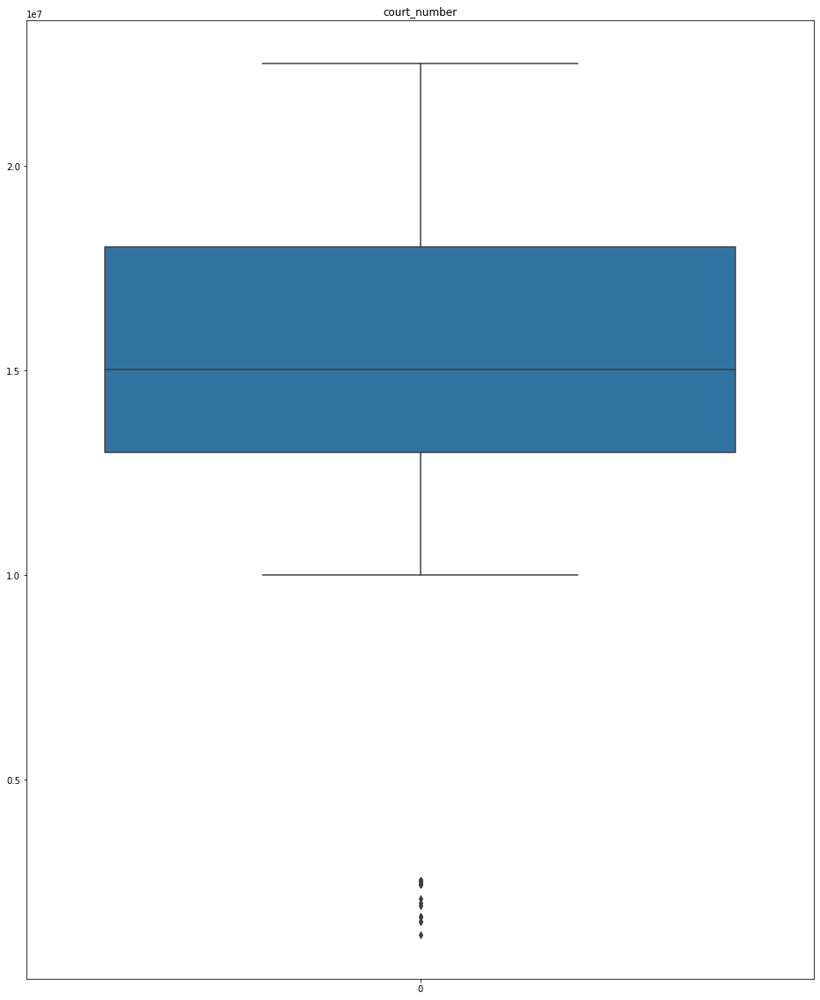

In [34]:
boxplots(df[['court_number']])

AttributeError: This method only works with the ScalarFormatter

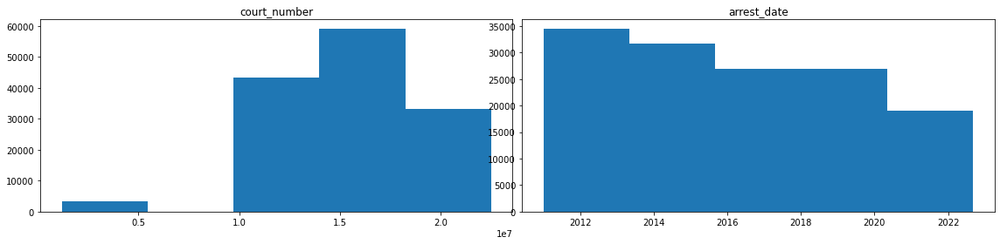

In [37]:
hists(df[['court_number', 'arrest_date']])

In [38]:
df

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken
0,11002204,2011-01-21,SFPD,Willful Homicide,Felony,No,Discharged
1,11008968,2011-03-31,SFPD,Willful Homicide,Felony,No,Discharged
2,11008679,2011-03-28,SFPD,Willful Homicide,Felony,No,Discharged
3,2460003,2011-05-25,SFPD,Willful Homicide,Felony,No,Discharged
4,11018969,2011-07-15,SFPD,Willful Homicide,Felony,No,Discharged
...,...,...,...,...,...,...,...
138971,22009862,2022-08-31,SFPD,NA (Att.),Felony,No,Charges Filed
138972,13019620,2013-07-15,SFPD,NA (Att.),Felony,No,Charges Filed
138973,14015903,2014-06-15,SFPD,NA (Att.),Felony,No,Charges Filed
138974,20006299,2020-05-30,SFPD,NA (Att.),Felony,No,Charges Filed


In [39]:
summarize(df)


    DataFrame .head():
    -----------------
|    |   court_number | arrest_date         | arresting_agency   | crime_type       | booked_case_type   | dv_case   | da_action_taken   |
|---:|---------------:|:--------------------|:-------------------|:-----------------|:-------------------|:----------|:------------------|
|  0 |       11002204 | 2011-01-21 00:00:00 | SFPD               | Willful Homicide | Felony             | No        | Discharged        |
|  1 |       11008968 | 2011-03-31 00:00:00 | SFPD               | Willful Homicide | Felony             | No        | Discharged        |
|  2 |       11008679 | 2011-03-28 00:00:00 | SFPD               | Willful Homicide | Felony             | No        | Discharged        |
|  3 |        2460003 | 2011-05-25 00:00:00 | SFPD               | Willful Homicide | Felony             | No        | Discharged        |
|  4 |       11018969 | 2011-07-15 00:00:00 | SFPD               | Willful Homicide | Felony             | No        | Discharged        |
    
    DataFrame .info():
    -----------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138976 entries, 0 to 138975
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   court_number      138976 non-null  int64         
 1   arrest_date       138976 non-null  datetime64[ns]
 2   arresting_agency  138976 non-null  object        
 3   crime_type        138976 non-null  object        
 4   booked_case_type  138976 non-null  object        
 5   dv_case           138976 non-null  object        
 6   da_action_taken   138976 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 7.4+ MB
None
Number of Columns with nulls: 0



    
    DataFrame .describe():
    -----------------
|              |   count |        mean |         std |         min |         25% |        50% |         75% |      max |
|:-------------|--------:|------------:|------------:|------------:|------------:|-----------:|------------:|---------:|
| court_number |  138976 | 1.54163e+07 | 3.82012e+06 | 1.20094e+06 | 1.30068e+07 | 1.5024e+07 | 1.80177e+07 | 2.25e+07 |
    
    Null Value Assessments:
    -----------------
        
        Nulls By Column:
| num_rows_missing   | percent_missing   |
|--------------------|-------------------|
    -----------------
        
        Nulls By Row:
|    |   num_cols_missing |   percent_missing |   count |
|---:|-------------------:|------------------:|--------:|
|  0 |                  0 |                 0 |  138976 |
    
    DataFrame .value_counts():
    -----------------
    
    

Column Name:  court_number 
--------------
Numerical: Divided by Quartile
 -  10 bins


|                                 |   court_number |
|:--------------------------------|---------------:|
| (1179645.9000000001, 3330854.9] |           3337 |
| (3330854.9, 5460764.8]          |              0 |
| (5460764.8, 7590674.7]          |              0 |
| (7590674.7, 9720584.6]          |              0 |
| (9720584.6, 11850494.5]         |          14834 |
| (11850494.5, 13980404.4]        |          28516 |
| (13980404.4, 16110314.3]        |          36498 |
| (16110314.3, 18240224.2]        |          22649 |
| (18240224.2, 20370134.1]        |          20098 |
| (20370134.1, 22500044.0]        |          13044 |



-------------
Column Name:  arrest_date 
--------------
Numerical: Divided by Quartile
 -  10 bins


|                                                      |   arrest_date |
|:-----------------------------------------------------|--------------:|
| (2010-12-27 17:38:23.999999999, 2012-03-02 12:00:00] |         17821 |
| (2012-03-02 12:00:00, 2013-05-03]                    |         16729 |
| (2013-05-03, 2014-07-03 12:00:00]                    |         17077 |
| (2014-07-03 12:00:00, 2015-09-03]                    |         14531 |
| (2015-09-03, 2016-11-02 12:00:00]                    |         13765 |
| (2016-11-02 12:00:00, 2018-01-03]                    |         13140 |
| (2018-01-03, 2019-03-05 12:00:00]                    |         14062 |
| (2019-03-05 12:00:00, 2020-05-05]                    |         12859 |
| (2020-05-05, 2021-07-05 12:00:00]                    |          9794 |
| (2021-07-05 12:00:00, 2022-09-05]                    |          9198 |



-------------
Column Name:  arresting_agency 
--------------
Categorical:
 -  24 Categories


|      |   arresting_agency |
|:-----|-------------------:|
| SFPD |             109265 |
| SFSD |              15511 |
| CHP  |               9318 |
| BART |               1359 |
| OTH  |                666 |
| APD  |                629 |
| UCPO |                627 |
| SFSU |                436 |
| USPA |                423 |
| OTHE |                407 |
| SFDA |                123 |
| UCSF |                106 |
| SFSO |                 67 |
| CHPS |                 10 |
| CHPI |                  9 |
| USPS |                  6 |
| ACC  |                  5 |
| FBI  |                  2 |
| FDEA |                  2 |
| MUNI |                  1 |
| CDOJ |                  1 |
| SAN  |                  1 |
| MVPD |                  1 |
| SFSC |                  1 |



-------------
Column Name:  crime_type 
--------------
Categorical:
 -  46 Categories


|                                   |   crime_type |
|:----------------------------------|-------------:|
| Assault                           |        26284 |
| Narcotics                         |        19475 |
| Other                             |        14313 |
| Burglary                          |        13566 |
| DUI                               |        12245 |
| Assault and Battery               |        11519 |
| Theft                             |         7668 |
| Robbery                           |         6962 |
| Weapons                           |         5701 |
| Motor Vehicle Theft               |         5491 |
| Petty Theft                       |         2090 |
| Trespassing                       |         1850 |
| Marijauana                        |         1524 |
| Selected Traffic                  |         1451 |
| Other Sex Law Violations          |         1048 |
| Prostitution                      |          800 |
| Willful Homicide (Att.)           |          738 |
| Forgery, Checks, Access Cards     |          647 |
| Forcible Rape                     |          628 |
| Arson                             |          603 |
| Kidnapping                        |          571 |
| NA (Att.)                         |          505 |
| Willful Homicide                  |          460 |
| Other Theft                       |          446 |
| Hit-and-Run                       |          444 |
| Vandalism                         |          443 |
| Local SF Ordinance                |          290 |
| Disorderly Conduct                |          208 |
| Indecent Exposure                 |          191 |
| Liquor Laws                       |          174 |
| Malicious Mischief                |          114 |
| Disturbing Peace                  |          105 |
| Lewd Conduct                      |          104 |
| Manslaughter - Vehicular          |           76 |
| Lewd or Lascivious                |           65 |
| Escape                            |           59 |
| Unlawful Sexual Intercourse       |           39 |
| Manslaughter - Non Vehicular      |           18 |
| Annoy/Molest Children             |           16 |
| Enhancements                      |           15 |
| Faiulre to Appear/Non-Traffic     |           11 |
| Contributing Delinquency of Minor |            9 |
| Gambling                          |            6 |
| Probation Violation               |            2 |
| Obscene Matter                    |            1 |
| Incorrect Categorization          |            1 |



-------------
Column Name:  booked_case_type 
--------------
Categorical:
 -  2 Categories


|             |   booked_case_type |
|:------------|-------------------:|
| Felony      |              96974 |
| Misd Arrest |              42002 |



-------------
Column Name:  dv_case 
--------------
Categorical:
 -  2 Categories


|     |   dv_case |
|:----|----------:|
| No  |    122034 |
| Yes |     16942 |



-------------
Column Name:  da_action_taken 
--------------
Categorical:
 -  5 Categories


|                                 |   da_action_taken |
|:--------------------------------|------------------:|
| Charges Filed                   |             62988 |
| Discharged                      |             43204 |
| MTR/Referred to Other Agency    |             19823 |
| Further Investigation Requested |              7566 |
| Other Action                    |              5395 |



-------------
-----------------
---End of Line---


In [40]:
df[df.court_number < 4_000_000]

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken
3,2460003,2011-05-25,SFPD,Willful Homicide,Felony,No,Discharged
74,2514631,2019-02-26,SFPD,Willful Homicide,Felony,No,Discharged
76,2514821,2019-03-07,APD,Willful Homicide,Felony,No,Discharged
85,2520541,2020-01-16,SFPD,Willful Homicide,Felony,No,Discharged
88,2522953,2020-07-09,SFPD,Willful Homicide,Felony,No,Discharged
...,...,...,...,...,...,...,...
138942,2525797,2021-03-19,SFPD,NA (Att.),Felony,No,Charges Filed
138945,2526156,2021-04-20,SFPD,NA (Att.),Felony,No,Charges Filed
138963,2529782,2022-03-15,SFPD,NA (Att.),Felony,No,Charges Filed
138964,2529783,2022-03-15,SFPD,NA (Att.),Felony,No,Charges Filed


In [42]:
df[df.crime_type == 'Willful Homicide (Att.)']

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken
8778,11000120,2011-01-01,SFPD,Willful Homicide (Att.),Felony,No,Further Investigation Requested
8804,11000808,2011-01-08,SFPD,Willful Homicide (Att.),Felony,No,Further Investigation Requested
8868,11002614,2011-01-25,SFPD,Willful Homicide (Att.),Felony,No,Further Investigation Requested
9435,11015671,2011-06-12,SFPD,Willful Homicide (Att.),Felony,No,Further Investigation Requested
9512,11017314,2011-06-28,SFPD,Willful Homicide (Att.),Felony,No,Discharged
...,...,...,...,...,...,...,...
35747,19013331,2019-08-23,SFPD,Willful Homicide (Att.),Felony,No,Charges Filed
35757,19018247,2019-11-20,SFPD,Willful Homicide (Att.),Felony,No,Charges Filed
35764,20004267,2020-03-27,SFPD,Willful Homicide (Att.),Felony,No,Charges Filed
35773,20011151,2020-10-14,SFPD,Willful Homicide (Att.),Felony,No,Charges Filed


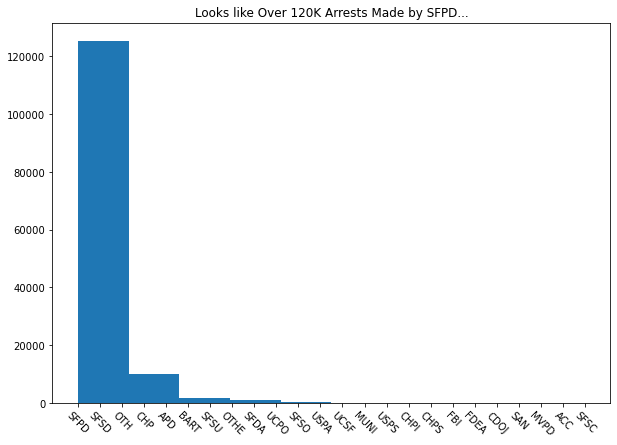

In [52]:
plt.figure(figsize=(10,7))

plt.hist(data= df, x= 'arresting_agency')

plt.title('Looks like Over 120K Arrests Made by SFPD...')
plt.xticks(rotation = -45)

plt.show()

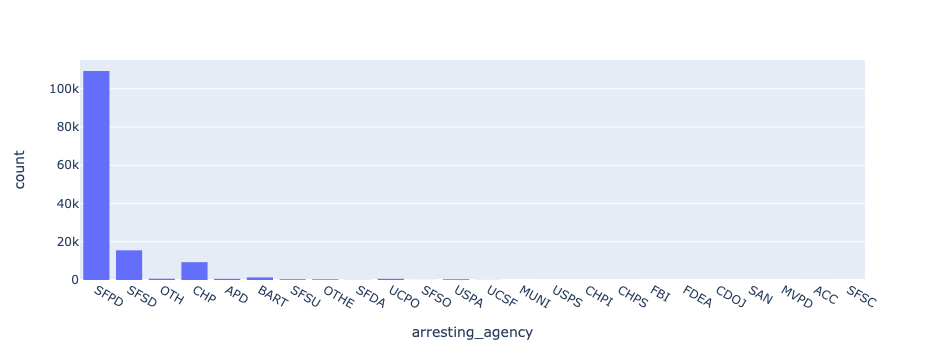

In [55]:
px.histogram(data_frame=df, x= 'arresting_agency', log_y=False)

In [ ]:
# for i in df.arresting_agency:
#     plt.hist(data= df[df.arresting_agency== i], x= 'booked_case_type')

#     plt.title(f'Arrests Made by {i} Ratio Felony to Misdemeanor')
#     # plt.xticks(rotation = -45)
#     plt.tight_layout()

#     plt.show()

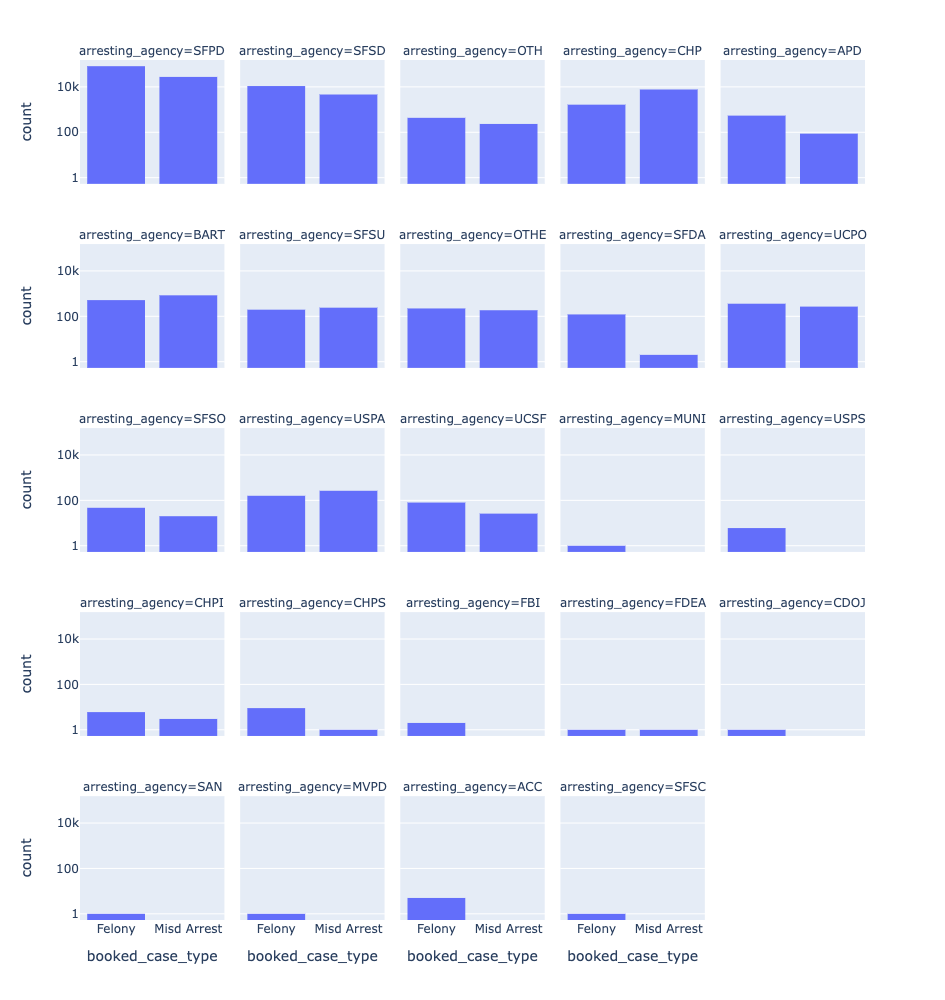

In [71]:
px.histogram(data_frame=df, 
             x= 'booked_case_type',
             facet_col= 'arresting_agency',
             facet_col_wrap=5,
             # facet_col_spacing=.1,
             height=1000,
             # barnorm='fraction'
             log_y=True
            )

- **Let's only look at agencies that made at least 100 arrests per year**
- **That's an average of less than 1 every 3 days**
- **If an Agency is doing less than that, it's hardly influencing overall trends in the system**

In [80]:
for i in df.arresting_agency.unique():
    print(i)
    if len(df[df.arresting_agency == i]) < 1000:
        print('--->> drop',i)
        df= df.drop(index=df.index[df.arresting_agency == i])

SFPD
SFSD
OTH
--->> drop OTH
CHP
APD
--->> drop APD
BART
SFSU
--->> drop SFSU
OTHE
--->> drop OTHE
SFDA
--->> drop SFDA
UCPO
--->> drop UCPO
SFSO
--->> drop SFSO
USPA
--->> drop USPA
UCSF
--->> drop UCSF
MUNI
--->> drop MUNI
USPS
--->> drop USPS
CHPI
--->> drop CHPI
CHPS
--->> drop CHPS
FBI
--->> drop FBI
FDEA
--->> drop FDEA
CDOJ
--->> drop CDOJ
SAN
--->> drop SAN
MVPD
--->> drop MVPD
ACC
--->> drop ACC
SFSC
--->> drop SFSC


In [81]:
df

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken
0,11002204,2011-01-21,SFPD,Willful Homicide,Felony,No,Discharged
1,11008968,2011-03-31,SFPD,Willful Homicide,Felony,No,Discharged
2,11008679,2011-03-28,SFPD,Willful Homicide,Felony,No,Discharged
3,2460003,2011-05-25,SFPD,Willful Homicide,Felony,No,Discharged
4,11018969,2011-07-15,SFPD,Willful Homicide,Felony,No,Discharged
...,...,...,...,...,...,...,...
138971,22009862,2022-08-31,SFPD,NA (Att.),Felony,No,Charges Filed
138972,13019620,2013-07-15,SFPD,NA (Att.),Felony,No,Charges Filed
138973,14015903,2014-06-15,SFPD,NA (Att.),Felony,No,Charges Filed
138974,20006299,2020-05-30,SFPD,NA (Att.),Felony,No,Charges Filed


In [82]:
df.arresting_agency.unique()

array(['SFPD', 'SFSD', 'CHP', 'BART'], dtype=object)

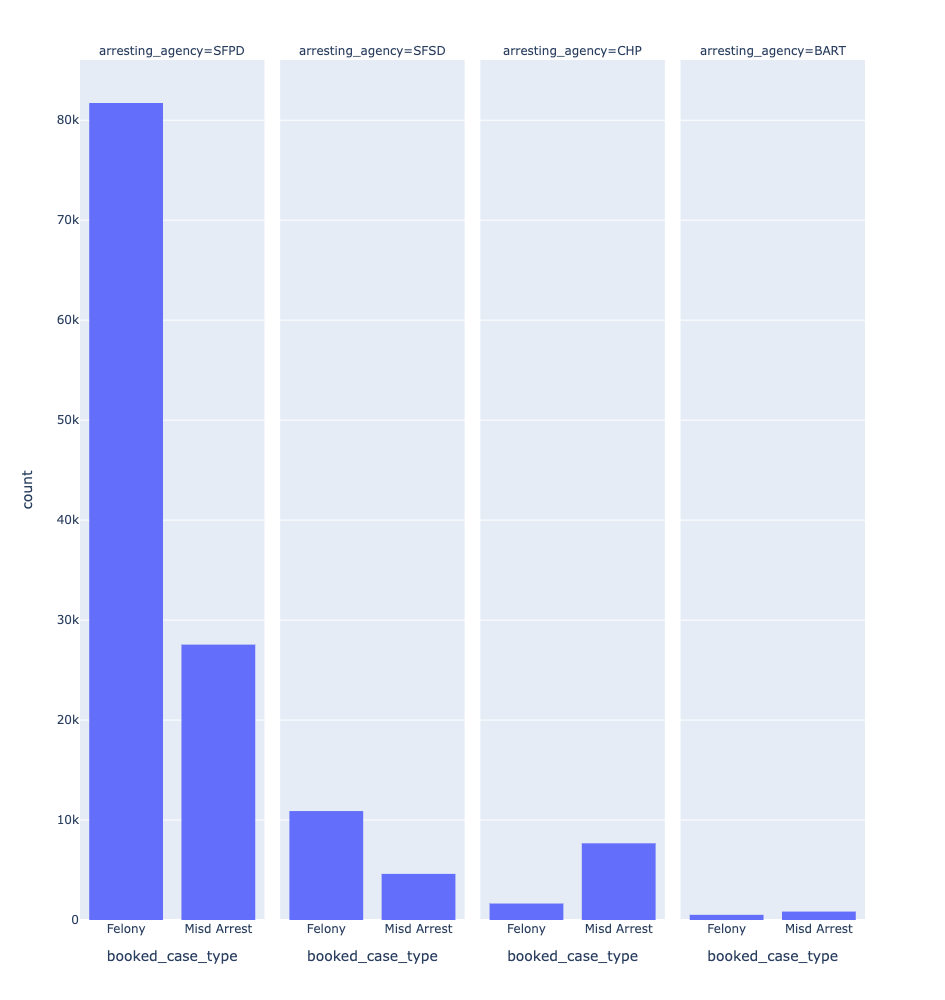

In [84]:
px.histogram(data_frame=df, 
             x= 'booked_case_type',
             facet_col= 'arresting_agency',
             facet_col_wrap=5,
             # facet_col_spacing=.1,
             height=1000,
             # barnorm='fraction'
             # log_y=True
            )

In [92]:
from formating import percent

In [97]:
for i in df.arresting_agency.unique():
    case_type_counts = df.booked_case_type[df.arresting_agency == i].value_counts(sort=False)
    tot_case = case_type_counts[0] + case_type_counts[1]
    fel_per = case_type_counts[0] / tot_case
    misd_per = case_type_counts[1] / tot_case
    print(f"{i}:\n\n {case_type_counts}\n\nFelony Percentage: {percent(fel_per)}\
\nMisdemeanor Percenrage: {percent(misd_per)}\n\n\n")

SFPD:

 Felony         81721
Misd Arrest    27544
Name: booked_case_type, dtype: int64

Felony Percentage: 74.79%
Misdemeanor Percenrage: 25.21%



SFSD:

 Felony         10897
Misd Arrest     4614
Name: booked_case_type, dtype: int64

Felony Percentage: 70.25%
Misdemeanor Percenrage: 29.75%



CHP:

 Felony         1646
Misd Arrest    7672
Name: booked_case_type, dtype: int64

Felony Percentage: 17.66%
Misdemeanor Percenrage: 82.34%



BART:

 Felony         517
Misd Arrest    842
Name: booked_case_type, dtype: int64

Felony Percentage: 38.04%
Misdemeanor Percenrage: 61.96%





In [99]:
df.arresting_agency.value_counts()

SFPD    109265
SFSD     15511
CHP       9318
BART      1359
Name: arresting_agency, dtype: int64

## Felony/Misdemeanor Arrest Rates by Agency

|Agency|Total Arrests|Felony | Misdemeanor |
|---|---|---|---|
|SF Police D.| 109k| 75%| 25%|
|SF Sherrif Dept| 15.5k|70%| 30%|
|Cali. Highway Patrol| 9k |18% | 82%|
|Bay Area Rapid Trainsit| 1k | 38%| 62%|
<br><br>
- **It looks like the reported data shows The Police and Sherriff's Departments mostly deal with Felony Arrests**
- **While the Highway Patrol is almost entirely Misdemeanors**
- **And the Bay Area Rapid Transit has the closest to even percentages of Felony and Misdemeanor**
  - **With the exception that they only have 1359 total arrests in over 10 years**

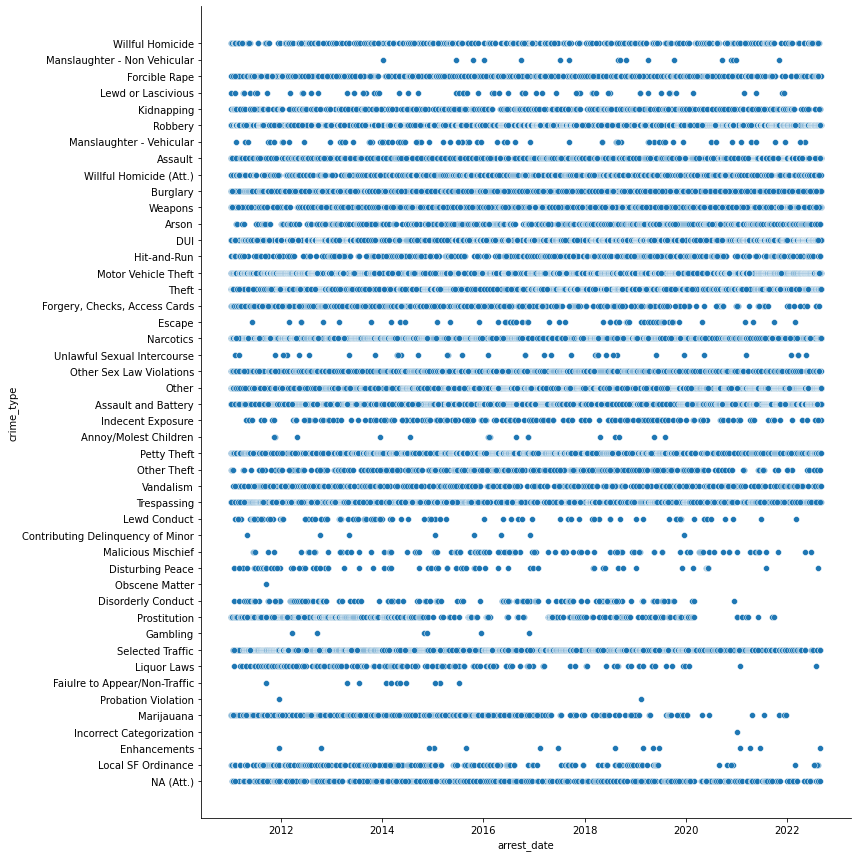

In [102]:
sns.relplot(data=df,
            x= 'arrest_date',
            y= 'crime_type',
            height= 12
           )

plt.show()


### Observations

- **Failure to Appear/Non-Traffic seems to drop off completely by 2016**
- **There only seems to be 1 'Incorrect Categorization'**
  - **probably drop that**
  
- **

In [103]:
df.crime_type.value_counts()

Assault                              25797
Narcotics                            18981
Other                                14000
Burglary                             13300
DUI                                  11824
Assault and Battery                  11152
Theft                                 7375
Robbery                               6892
Weapons                               5559
Motor Vehicle Theft                   5360
Petty Theft                           2041
Trespassing                           1740
Selected Traffic                      1414
Marijauana                            1403
Other Sex Law Violations              1021
Prostitution                           796
Willful Homicide (Att.)                733
Forgery, Checks, Access Cards          624
Forcible Rape                          615
Arson                                  592
Kidnapping                             560
NA (Att.)                              488
Willful Homicide                       456
Hit-and-Run

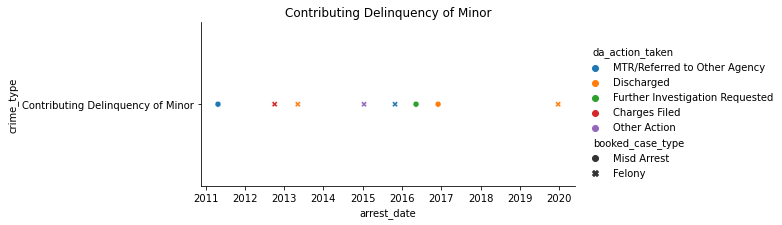

In [113]:
crime = 'Contributing Delinquency of Minor'

sns.relplot(data=df[df.crime_type == crime],
            x= 'arrest_date',
            y= 'crime_type',
            style= 'booked_case_type',
            hue= 'da_action_taken',
            height= 3,
            aspect= 3
           )
plt.title(f'{crime}')

plt.show()


In [141]:
type(df.arrest_date[0])

pandas._libs.tslibs.timestamps.Timestamp

In [146]:
# df['year'] = 
df[['arrest_date']].strftime('%Y')

AttributeError: 'DataFrame' object has no attribute 'strftime'

In [147]:
df_time = df.set_index('arrest_date')

In [148]:
df_time

,court_number,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken
arrest_date,,,,,,
2011-01-21,11002204,SFPD,Willful Homicide,Felony,No,Discharged
2011-03-31,11008968,SFPD,Willful Homicide,Felony,No,Discharged
2011-03-28,11008679,SFPD,Willful Homicide,Felony,No,Discharged
2011-05-25,2460003,SFPD,Willful Homicide,Felony,No,Discharged
2011-07-15,11018969,SFPD,Willful Homicide,Felony,No,Discharged
...,...,...,...,...,...,...
2022-08-31,22009862,SFPD,NA (Att.),Felony,No,Charges Filed
2013-07-15,13019620,SFPD,NA (Att.),Felony,No,Charges Filed
2014-06-15,14015903,SFPD,NA (Att.),Felony,No,Charges Filed


In [152]:
df_time['year'] = df_time.index.year

In [154]:
df['year'] = df_time.index.year

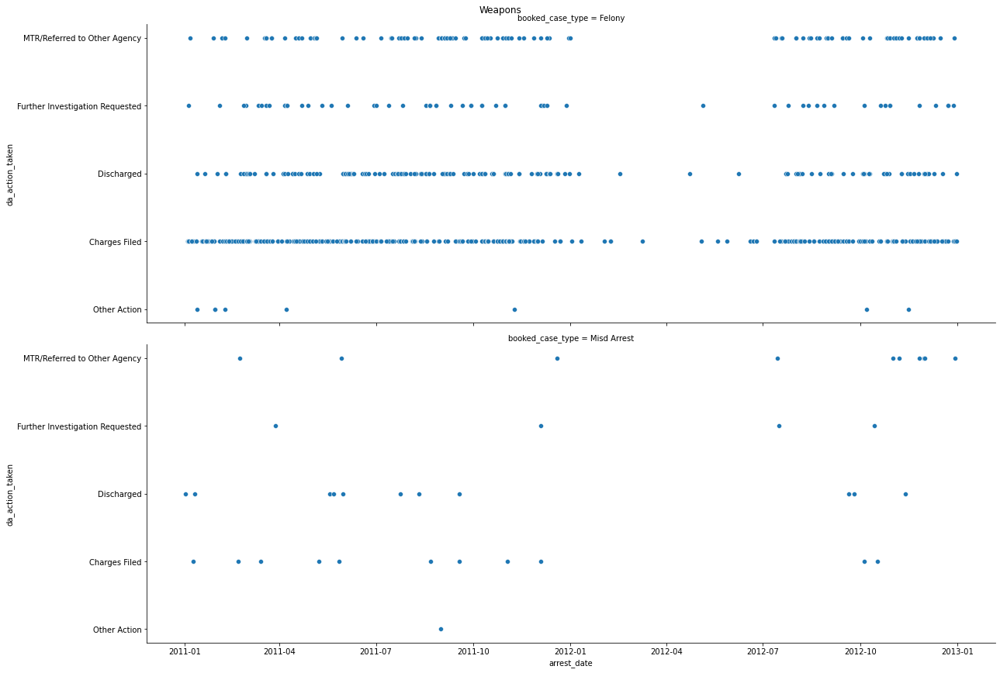

In [139]:
crime = 'Weapons'
date_range = ['2011' , '2013']

sns.relplot(data=df[(df.crime_type == crime) & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1)

plt.show()


- **There seemed to be a drop in Weapon arrests during the first half of 2012... I wonder why**

In [183]:
df.da_action_taken.unique()

array(['Discharged', 'Further Investigation Requested',
       'MTR/Referred to Other Agency', 'Charges Filed', 'Other Action'],
      dtype=object)

In [182]:
df.da_action_taken.cat.set_categories(['Discharged', 'Further Investigation Requested',
       'MTR/Referred to Other Agency', 'Charges Filed', 'Other Action']

0            Discharged
1            Discharged
2            Discharged
3            Discharged
4            Discharged
              ...      
138971    Charges Filed
138972    Charges Filed
138973    Charges Filed
138974    Charges Filed
138975    Charges Filed
Name: da_action_taken, Length: 135453, dtype: object

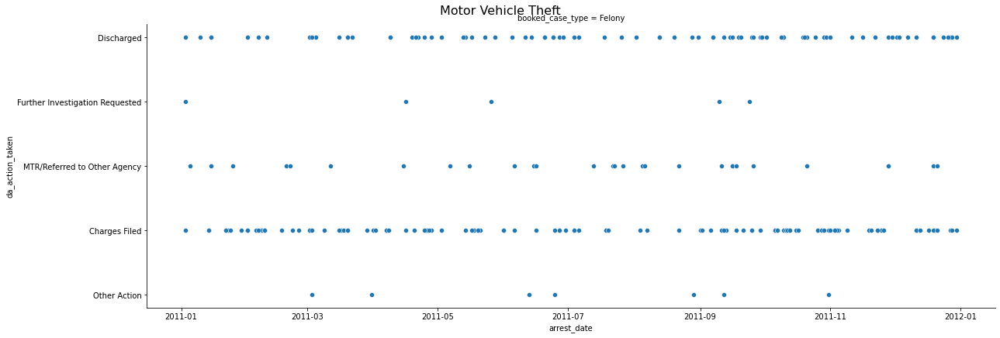

In [181]:
crime = 'Motor Vehicle Theft'
# date_range = ['2011' , '2013']
year = 2011

sns.relplot(data=df[(df.crime_type == crime) & (df.year == year)],# & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            # col= 'year',
            # col_wrap=1,
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1, fontsize=16)

plt.show()
